In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import torchvision
import torch
import torch.nn as nn 
import torch.nn.functional as F 
from torchvision import datasets, transforms
import torch.optim as optim

In [14]:
class PimaClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden1 = nn.Linear(1 , 20)  # Update the input size to 1
        self.act1 = nn.ReLU()
        self.hidden2 = nn.Linear(20,80)
        self.act2 = nn.ReLU()
        self.hidden3 = nn.Linear( 80 , 100)
        self.act3 = nn.ReLU()
        self.hidden4 = nn.Linear(100 ,200 )
        self.act4 = nn.ReLU()
        self.hidden5 = nn.Linear(200,100)
        self.act5 = nn.ReLU()
        self.output = nn.Linear(100, 1)
        self.act_output = nn.Sigmoid()

    def forward(self, x):
        x = self.act1(self.hidden1(x))
        x = self.act2(self.hidden2(x))
        x = self.act3(self.hidden3(x))
        x = self.act3(self.hidden4(x))
        x = self.act3(self.hidden5(x))
        x = self.act_output(self.output(x))
        return x

model = PimaClassifier()
print(model)


class MLP() : 
    loss_fn = nn.BCELoss()  # binary cross entropy
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    def __init__(self, epoch=100 , batch = 10 , x_train =None , y_train=None) :    #, y_test=None,x_test=None ) :
        self.n_epochs = epoch 
        self.batch_size = batch 
        self.x_train = x_train 
        self.y_train = y_train 
      

    def plotting(self, xbatch , predictions):
        x_train =self.x_train
        y_train = self.y_train
        xbatch = xbatch.detach().numpy()
        predictions = predictions.detach().numpy()

        plt.figure()
        plt.plot(x_train, y_train, label='Ground Truth')
        plt.plot(xbatch , predictions, label='Predictions')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()
        plt.show()

    def train_model(self ,model ) :
        for epoch in range(self.n_epochs):
            for i in range(0, len(self.x_train),self.batch_size):
                Xbatch = self.x_train[i:i+self.batch_size]
                y_pred = model(Xbatch)
                # print(len(self.y_train))
                ybatch = self.y_train[i:i+self.batch_size]
                # print(len(ybatch))
                loss = self.loss_fn(y_pred, ybatch)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                # self.plotting(Xbatch , y_pred)
            print(f'Finished epoch {epoch}, latest loss {loss}')
    
    def Test_Model(self ) : 
        with torch.no_grad():
            y_pred = model(self.x_train)
        accuracy = (y_pred.round() == self.y_train).float().mean()
        self.plotting( self.x_train , y_pred )
        print(f"Train Accuracy {accuracy}")


PimaClassifier(
  (hidden1): Linear(in_features=1, out_features=20, bias=True)
  (act1): ReLU()
  (hidden2): Linear(in_features=20, out_features=80, bias=True)
  (act2): ReLU()
  (hidden3): Linear(in_features=80, out_features=100, bias=True)
  (act3): ReLU()
  (hidden4): Linear(in_features=100, out_features=200, bias=True)
  (act4): ReLU()
  (hidden5): Linear(in_features=200, out_features=100, bias=True)
  (act5): ReLU()
  (output): Linear(in_features=100, out_features=1, bias=True)
  (act_output): Sigmoid()
)


In [18]:
data = pd.read_csv("doudle1.csv")
X = torch.tensor(np.array(data["x"]) , dtype=torch.float32 ) 
Y = torch.tensor(np.array(data["y"]) , dtype=torch.float32 ) 
X = X.unsqueeze(1)
Y = Y.unsqueeze(1)
Y_max = max(Y)
Y = Y/Y_max 
mlp = MLP( epoch=80000 , batch=5 , x_train=X , y_train=Y )
mlp.train_model(model=model)


Finished epoch 0, latest loss 0.5855045914649963
Finished epoch 1, latest loss 0.5880694389343262
Finished epoch 2, latest loss 0.5960652828216553
Finished epoch 3, latest loss 0.5849165916442871
Finished epoch 4, latest loss 0.5914726853370667
Finished epoch 5, latest loss 0.5894088745117188
Finished epoch 6, latest loss 0.603061318397522
Finished epoch 7, latest loss 0.5939741730690002
Finished epoch 8, latest loss 0.5969913005828857
Finished epoch 9, latest loss 0.5828049182891846
Finished epoch 10, latest loss 0.5800820589065552
Finished epoch 11, latest loss 0.583415150642395
Finished epoch 12, latest loss 0.5937076807022095
Finished epoch 13, latest loss 0.5815935134887695
Finished epoch 14, latest loss 0.583269476890564
Finished epoch 15, latest loss 0.5833932161331177
Finished epoch 16, latest loss 0.6005038619041443
Finished epoch 17, latest loss 0.5855386257171631
Finished epoch 18, latest loss 0.588975191116333
Finished epoch 19, latest loss 0.5840291976928711
Finished epoch

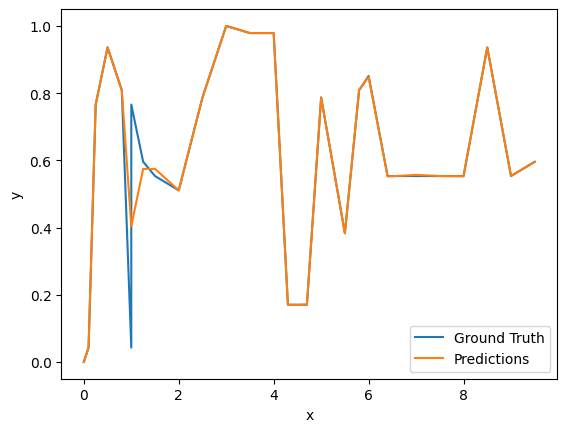

Train Accuracy 0.06896551698446274


In [19]:
mlp.Test_Model()

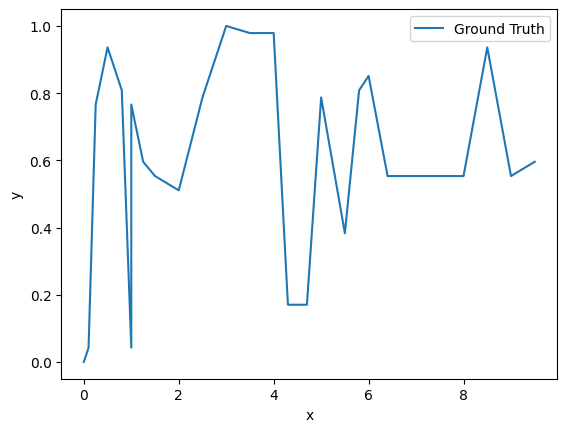

In [68]:
plt.figure()
plt.plot(X, Y, label='Ground Truth')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

In [80]:
data = pd.read_csv("doudle2.csv")
X = torch.tensor(np.array(data["x"]) , dtype=torch.float32 ) 
Y = torch.tensor(np.array(data["y"]) , dtype=torch.float32 ) 
X = X.unsqueeze(1)
Y = Y.unsqueeze(1)
Y_max = max(Y)
Y = Y/Y_max 
mlp = MLP( epoch=100000 , batch=5 , x_train=X , y_train=Y )
mlp.train_model(model=model)


Finished epoch 0, latest loss 0.5513126850128174
Finished epoch 1, latest loss 0.5508676767349243
Finished epoch 2, latest loss 0.550857424736023
Finished epoch 3, latest loss 0.5508232116699219
Finished epoch 4, latest loss 0.5508341789245605
Finished epoch 5, latest loss 0.5508171319961548
Finished epoch 6, latest loss 0.5508072376251221
Finished epoch 7, latest loss 0.550805926322937
Finished epoch 8, latest loss 0.5508079528808594
Finished epoch 9, latest loss 0.5508054494857788
Finished epoch 10, latest loss 0.5508175492286682
Finished epoch 11, latest loss 0.5508208274841309
Finished epoch 12, latest loss 0.5508139133453369
Finished epoch 13, latest loss 0.5508068203926086
Finished epoch 14, latest loss 0.5508108139038086
Finished epoch 15, latest loss 0.5508062839508057
Finished epoch 16, latest loss 0.5508034229278564
Finished epoch 17, latest loss 0.5508032441139221
Finished epoch 18, latest loss 0.5508021712303162
Finished epoch 19, latest loss 0.5507994890213013
Finished epo

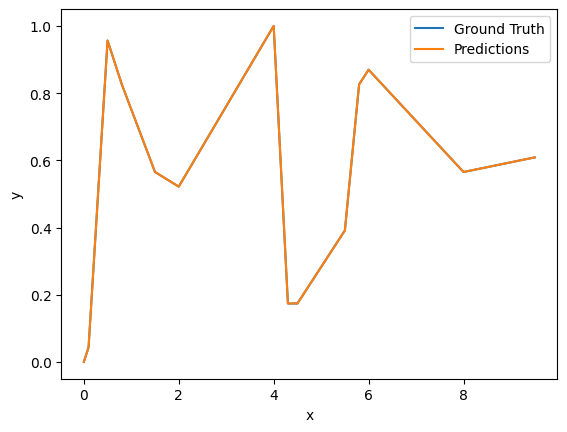

Train Accuracy 0.1428571492433548


In [81]:
mlp.Test_Model()

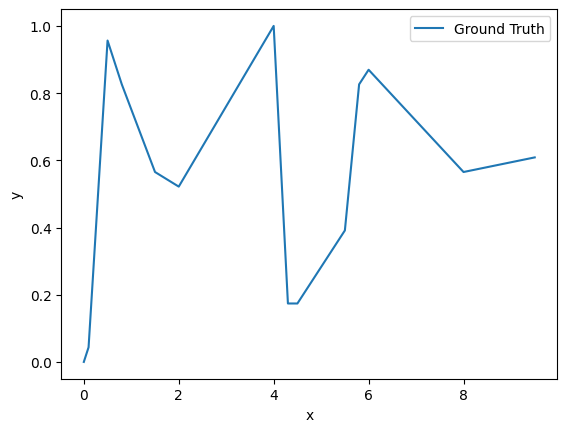

In [82]:
plt.figure()
plt.plot(X, Y, label='Ground Truth')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

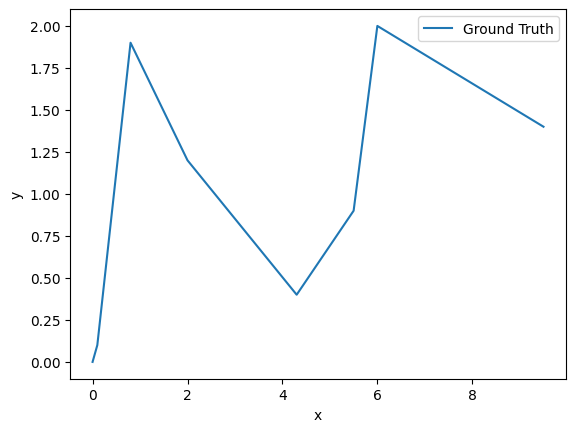

In [17]:
data = pd.read_csv("oudle3.csv")
X3 = torch.tensor(np.array(data["x"]) , dtype=torch.float32 ) 
Y3 = torch.tensor(np.array(data["y"]) , dtype=torch.float32 ) 
X3 = X3.unsqueeze(1)
Y3 = Y3.unsqueeze(1)
plt.figure()
plt.plot(X3, Y3, label='Ground Truth')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()